In [4]:
# Importing libraries 

import os
import librosa
import pandas as pd
import seaborn as sns
import numpy as np


from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

from scipy.spatial.distance import cdist
import librosa
import IPython.display as ipd
from sklearn.metrics import davies_bouldin_score
from sklearn.decomposition import PCA



In [5]:
# Directory containing audio files
audio_directory = r'C:\Users\alina\Desktop\Capstone Project\segmented_audio'
audio_files = [os.path.join(audio_directory, f) for f in os.listdir(audio_directory) if f.endswith('.wav')]


In [6]:
# Load the saved features
features_scaled = np.load(r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_data\features_scaled.npy')
print("Loaded features with shape:", features_scaled.shape)

Loaded features with shape: (86335, 13)


In [7]:
# Feature selection is done based on variance analysis
selected_features = features_scaled[:,[0,1,2,3]]

In [13]:
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(selected_features)

In [14]:
# Check to make sure the number of files matches the number of labels
if len(audio_files) != len(kmeans_labels):
    raise ValueError(f"Number of audio files ({len(audio_files)}) does not match number of labels ({len(kmeans_labels)}).")

# Create DataFrame
df = pd.DataFrame({
    'file_path': audio_files,
    'kmeans_label': kmeans_labels
})

# Save to CSV
output_csv_path = r'C:\Users\alina\Desktop\characterizing-soundscapes\cluster_basic\kmeans_labels.csv'
df.to_csv(output_csv_path, index=False)

print(f"Saved K-means labels to: {output_csv_path}")

Saved K-means labels to: C:\Users\alina\Desktop\characterizing-soundscapes\cluster_basic\kmeans_labels.csv


In [16]:
from sklearn.metrics import calinski_harabasz_score, silhouette_score

# Calculate Calinski-Harabasz Index
calinski_harabasz = calinski_harabasz_score(selected_features, kmeans_labels)

print(f"Calinski-Harabasz Index: {calinski_harabasz:.2f}")


Calinski-Harabasz Index: 75291.10


In [31]:
silhouette = silhouette_score(selected_features, kmeans_labels)

print(f"Silhouette Score: {silhouette:.4f}")

Silhouette Score: 0.4263


In [17]:
 # Perform PCA
pca = PCA(n_components=2)
features_2d = pca.fit_transform(selected_features)


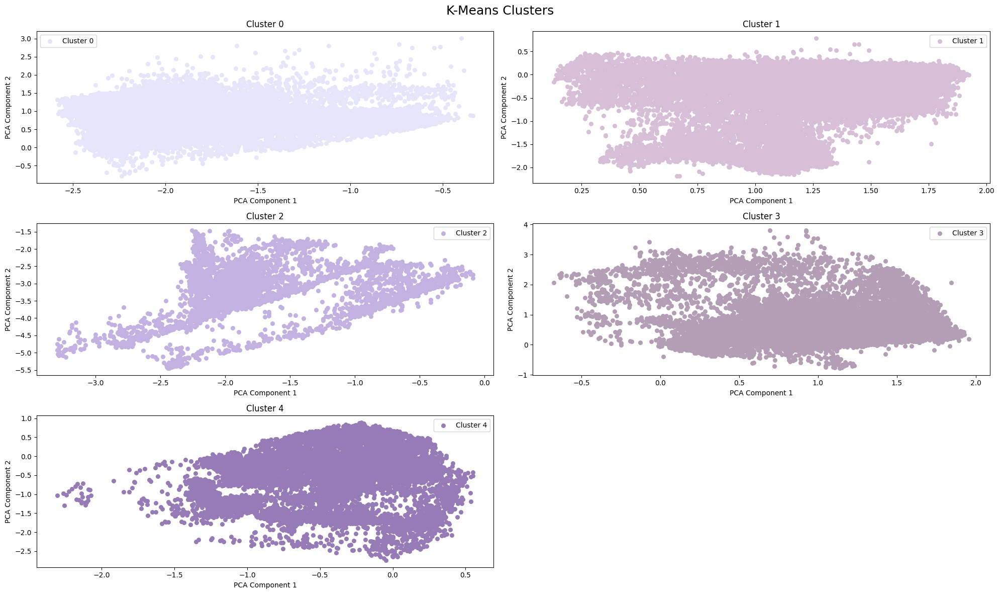

In [18]:

# Get unique cluster labels
unique_labels = np.unique(kmeans_labels)
n_clusters = len(unique_labels)

# Set up lavender color palette (custom shades)
lavender_palette = ['#E6E6FA', '#D8BFD8', '#C3B1E1', '#B39EB5', 
                    '#967BB6', '#6A5ACD', '#7B68EE', '#8A2BE2', 
                    '#9A7BFF', '#B19CD9']

# Set up grid for subplots (e.g., if 10 clusters, 2 rows x 5 columns works well)
n_cols = 2
n_rows = int(np.ceil(n_clusters / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12))
axes = axes.flatten()

for i, cluster_label in enumerate(unique_labels):
    ax = axes[i]
    cluster_points = features_2d[kmeans_labels == cluster_label]
    ax.scatter(cluster_points[:, 0], cluster_points[:, 1], s=30, c=lavender_palette[i % len(lavender_palette)], label=f"Cluster {cluster_label}")
    
    ax.set_title(f"Cluster {cluster_label}")
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")
    ax.legend()
    ax.grid(False)

# Hide unused subplots if there are fewer clusters than grid spaces
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Overall title
fig.suptitle("K-Means Clusters", fontsize=18)

# Tight layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 1]) 

plt.savefig('kmeans_clusters_lavender.png', dpi=300, bbox_inches='tight')

# Show combined figure
plt.show()


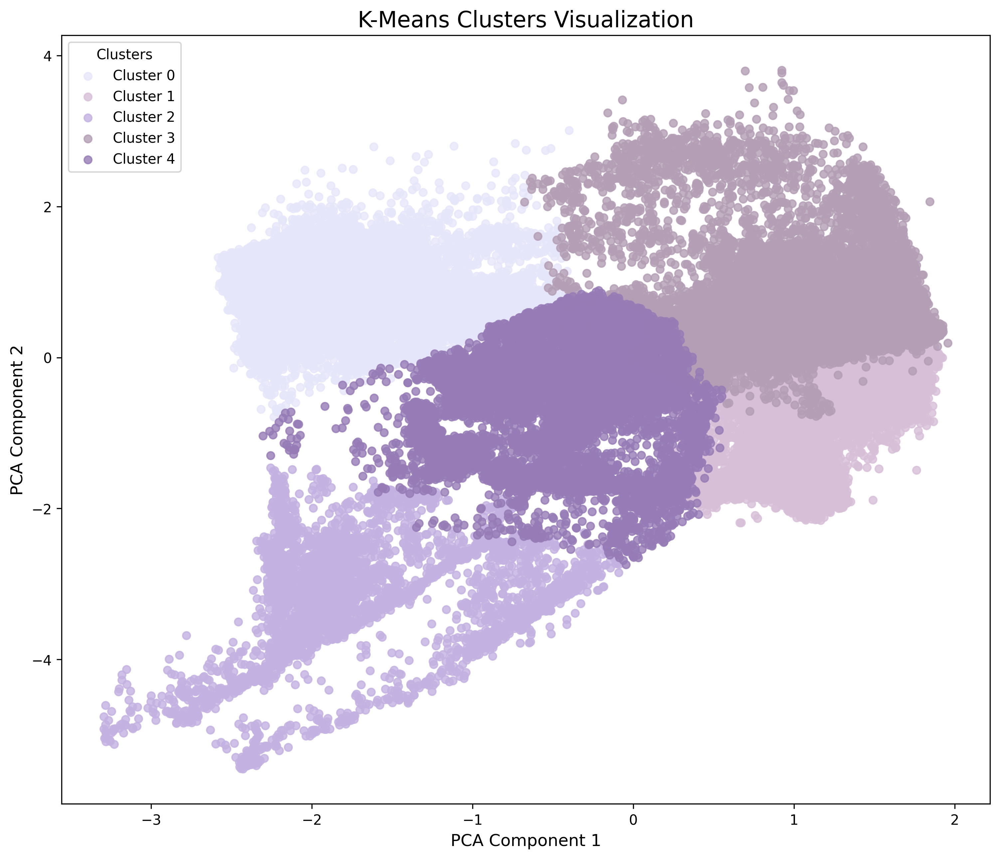

In [35]:
# Define a custom lavender-inspired colormap (discrete colors matching clusters)
lavender_palette = ['#E6E6FA', '#D8BFD8', '#C3B1E1', '#B39EB5', 
                    '#967BB6', '#6A5ACD', '#7B68EE', '#8A2BE2', 
                    '#9A7BFF', '#B19CD9']

# Ensure the palette is at least as long as the number of clusters
unique_labels = np.unique(kmeans_labels)
if len(unique_labels) > len(lavender_palette):
    raise ValueError(f"Not enough colors in palette for {len(unique_labels)} clusters.")

# Plot all clusters together
plt.figure(figsize=(12, 10), dpi=300)
for cluster_label in unique_labels:
    cluster_points = features_2d[kmeans_labels == cluster_label]
    plt.scatter(
        cluster_points[:, 0], cluster_points[:, 1],
        s=30, label=f"Cluster {cluster_label}", alpha=0.8,
        color=lavender_palette[cluster_label]  # Use lavender color for this cluster
    )

# Titles and labels
plt.title("K-Means Clusters Visualization", fontsize=16)
plt.xlabel("PCA Component 1", fontsize=12)
plt.ylabel("PCA Component 2", fontsize=12)
plt.legend(title="Clusters", fontsize=10)

# Save the plot to file
plt.savefig('kmeans_clusters_combined.png', dpi=300, bbox_inches='tight')

# Also display it for immediate viewing (optional)
plt.show()



In [20]:
def visualizations(features, cluster_labels, cluster_method, pca_features):
    """
    Create professional, research-worthy visualizations for clustering.
    
    Parameters:
        features: np.ndarray
            The dataset of shape (n_samples, n_features).
        cluster_labels: np.ndarray
            The cluster labels for each data point.
        cluster_method: str
            The clustering method used (e.g., KMeans, DBSCAN, Agglomerative).
        pca_features: np.ndarray
            PCA-transformed features for 2D visualization.
    """
    # Convert features to DataFrame for easier plotting
    feature_names = [f"Feature {i+1}" for i in range(features.shape[1])]
    df = pd.DataFrame(features, columns=feature_names)
    df['Cluster'] = cluster_labels

    # Subplots for distribution of features across clusters
    n_features = features.shape[1]
    n_cols = 2  # You can adjust this to a larger value if needed
    n_rows = (n_features // n_cols) + (1 if n_features % n_cols != 0 else 0)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.flatten()  # Flatten the axes array to easily index

    # Plot histograms of each feature with clusters as hue
    for i in range(n_features):
        ax = axes[i]
        sns.histplot(data=df, x=feature_names[i], hue='Cluster', multiple="stack", kde=True, ax=ax, bins=30)
        ax.set_title(f'{cluster_method}: {feature_names[i]} Distribution Across Clusters')

    # Remove unused subplots if there are more subplots than features
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

    # Plotting the clusters together in PCA-transformed space (2D)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1], hue=cluster_labels, palette="flare", s=10)
    plt.title(f'{cluster_method} - Clusters in PCA-reduced 2D space')
    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.legend(title='Cluster')
    plt.show()

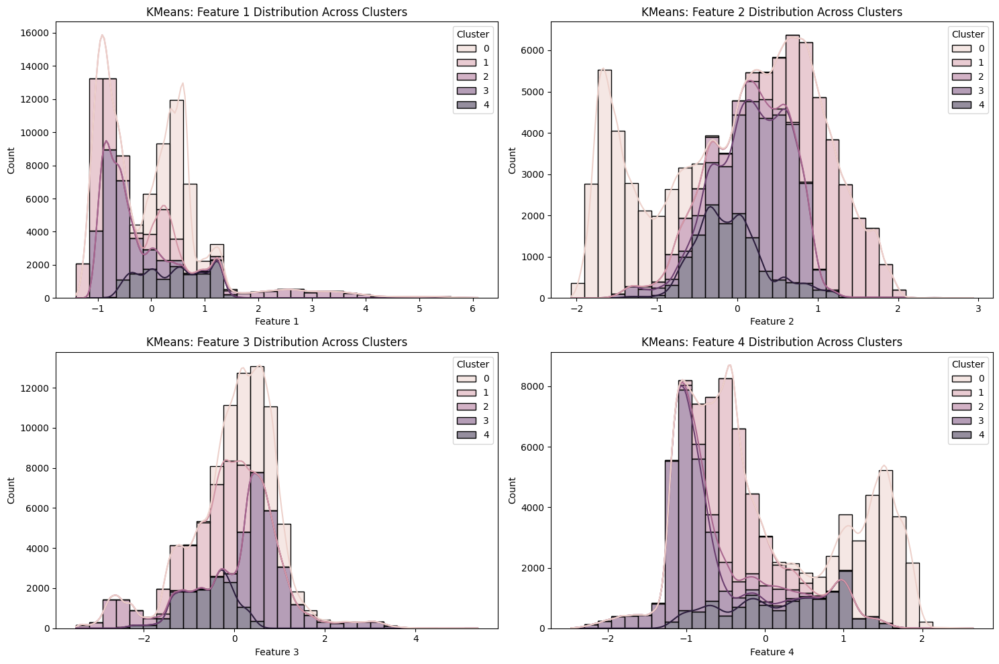

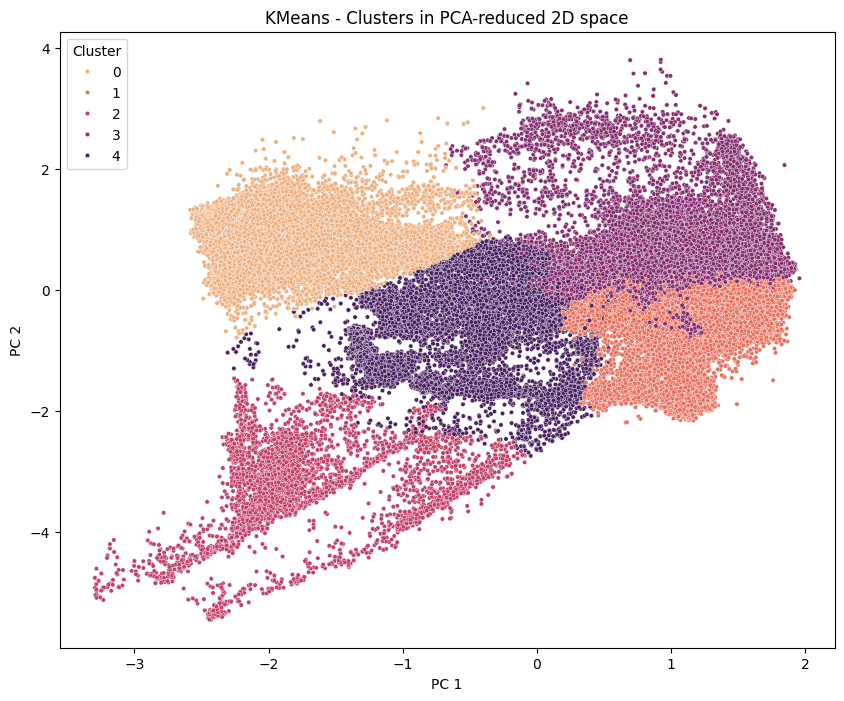

In [22]:
visualizations(selected_features, kmeans_labels, 'KMeans', features_2d)

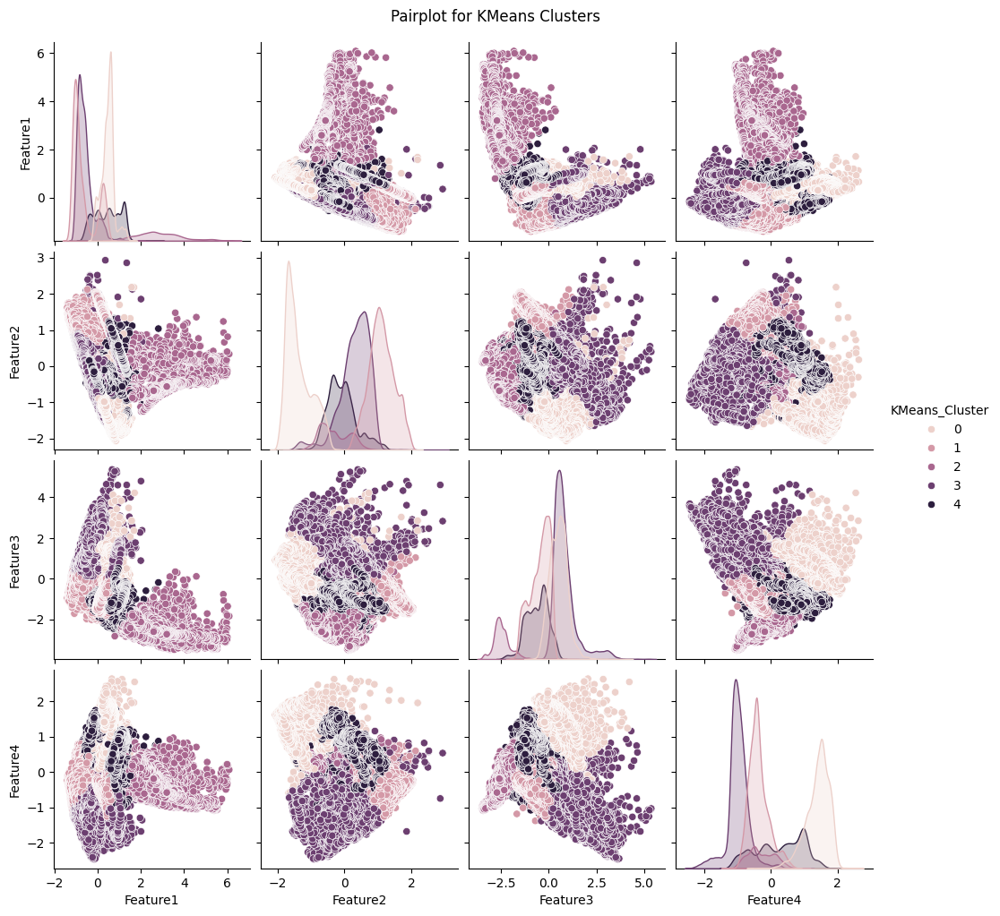

In [25]:
# Create a DataFrame from  scaled features with automatically generated column names
df_KMeans = pd.DataFrame(selected_features, columns=[f'Feature{i+1}' for i in range(selected_features.shape[1])])

# Add cluster labels to the DataFrame
df_KMeans['KMeans_Cluster'] = kmeans_labels
# Ensure clustering columns are treated as strings or categorical
df_KMeans['Kmeans_Cluster'] = df_KMeans['KMeans_Cluster'].astype(str)


# List of feature columns (excluding clustering columns)
feature_columns = df_KMeans.columns[df_KMeans.columns.str.contains('Feature')]
# Pair plot for DBSCAN clusters
sns.pairplot(df_KMeans, hue='KMeans_Cluster', vars=feature_columns)
plt.suptitle('Pairplot for KMeans Clusters', y=1.02)
plt.show()

In [23]:
from sklearn.metrics import pairwise_distances

def compute_cluster_centroids(features, labels, n_clusters):
    centroids = []
    for cluster_label in range(n_clusters):
        cluster_points = features[labels == cluster_label]
        centroid = np.mean(cluster_points, axis=0)
        centroids.append(centroid)
    return np.array(centroids)

def find_most_representative_samples(features, labels, file_paths, n_samples=5):
    n_clusters = len(np.unique(labels))
    centroids = compute_cluster_centroids(features, labels, n_clusters)

    representative_samples = {}

    for cluster_label in range(n_clusters):
        cluster_indices = np.where(labels == cluster_label)[0]
        cluster_features = features[cluster_indices]
        cluster_files = [file_paths[i] for i in cluster_indices]

        # Compute distance to centroid
        centroid = centroids[cluster_label].reshape(1, -1)
        distances = pairwise_distances(cluster_features, centroid, metric='euclidean')

        # Sort and select top 5 closest samples
        sorted_indices = np.argsort(distances.ravel())[:n_samples]
        representative_samples[cluster_label] = [cluster_files[i] for i in sorted_indices]

    return representative_samples

def plot_melspec_and_play(audio_file, ax):
    # Load audio
    y, sr = librosa.load(audio_file, sr=None)

    # Compute mel spectrogram
    melspec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    melspec_db = librosa.power_to_db(melspec, ref=np.max)

    # Plot mel spectrogram
    librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax)
    ax.set_title(f'Mel Spectrogram\n{os.path.basename(audio_file)}', fontsize=10)

    # Play audio (for Jupyter or IPython environments)
    display(ipd.Audio(audio_file))

def display_representative_samples(features, labels, file_paths, n_samples=5):
    representative_samples = find_most_representative_samples(features, labels, file_paths, n_samples)

    for cluster_label, files in representative_samples.items():
        print(f"\nCluster {cluster_label}: Most Representative Samples")
        fig, axes = plt.subplots(1, len(files), figsize=(20, 5), dpi=300)

        # Handle single-sample cluster case
        if len(files) == 1:
            axes = [axes]

        for i, file in enumerate(files):
            print(f"  - {file}")
            plot_melspec_and_play(file, axes[i])

        plt.suptitle(f"Cluster {cluster_label} - Most Representative Samples", fontsize=14)
        plt.tight_layout()
        plt.show()






Cluster 0: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_8444.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181002_000000_segment_7824.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_8529.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_8456.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181003_000000_segment_7800.wav


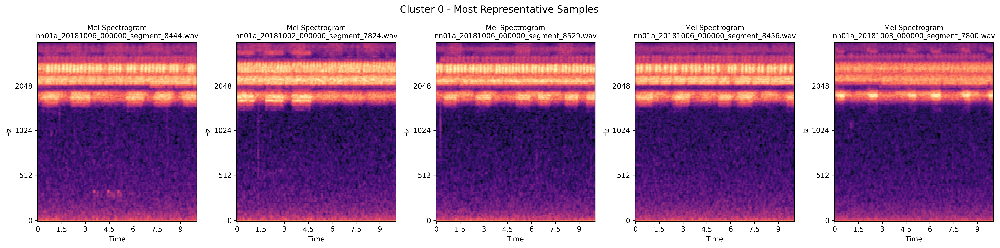


Cluster 1: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_5343.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_5573.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_4259.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_5595.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_5427.wav


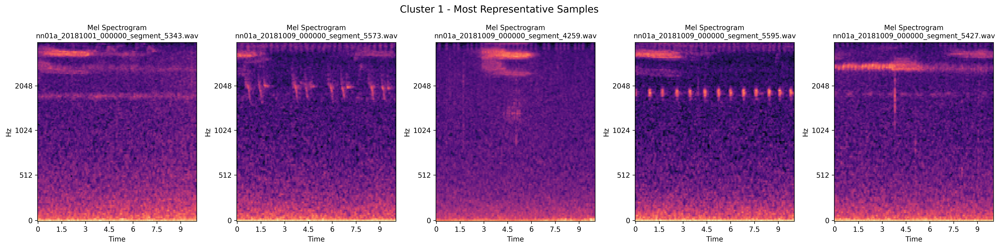


Cluster 2: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5439.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5429.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5514.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5516.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5515.wav


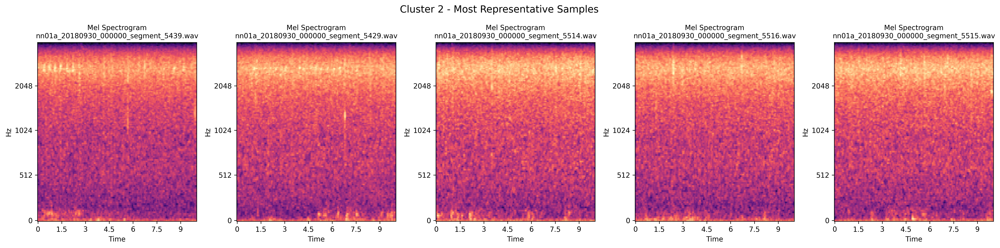


Cluster 3: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181003_000000_segment_2425.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_6014.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_6154.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181005_000000_segment_5190.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181009_000000_segment_6178.wav


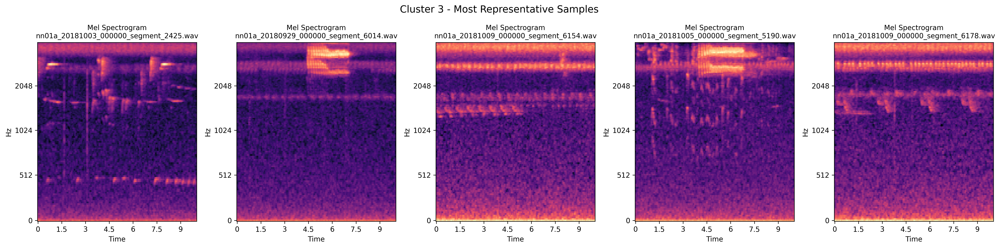


Cluster 4: Most Representative Samples
  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_522.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_620.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_644.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_758.wav


  - C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_971.wav


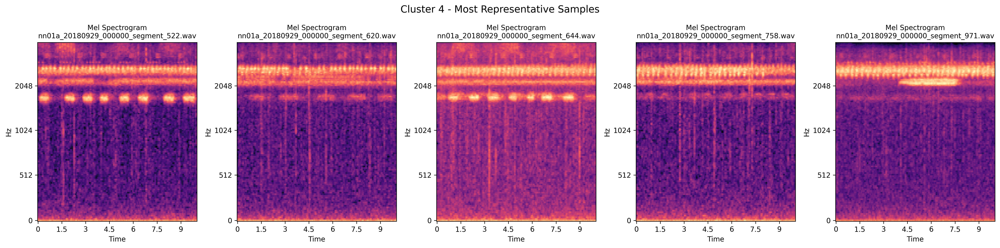

In [24]:
display_representative_samples(selected_features, kmeans_labels, audio_files)

In [26]:
selected_samples = find_most_representative_samples(selected_features, kmeans_labels, audio_files, n_samples=100)

In [27]:
def compute_shannon_index(audio, sr, n_fft=1024, hop_length=512):
    S = np.abs(librosa.stft(audio, n_fft=n_fft, hop_length=hop_length))**2
    energy_per_band = np.sum(S, axis=1)
    total_energy = np.sum(energy_per_band)
    proportions = energy_per_band / total_energy
    proportions = proportions[proportions > 0]  # Avoid log(0) errors
    shannon_index = -np.sum(proportions * np.log(proportions))
    return shannon_index

# Store results
shannon_results = []

# Loop through each cluster and its files
for cluster_label, files in selected_samples.items():
    for file_path in files:
        audio, sr = librosa.load(file_path, sr=None)
        shannon_index = compute_shannon_index(audio, sr)

        shannon_results.append({
            "filename": file_path,
            "cluster_label": cluster_label,
            "shannon_index": shannon_index
        })

# Convert results to DataFrame
shannon_df = pd.DataFrame(shannon_results)

# Save results to CSV
shannon_df.to_csv("kmeans_shannon_indices_per_cluster.csv", index=False)

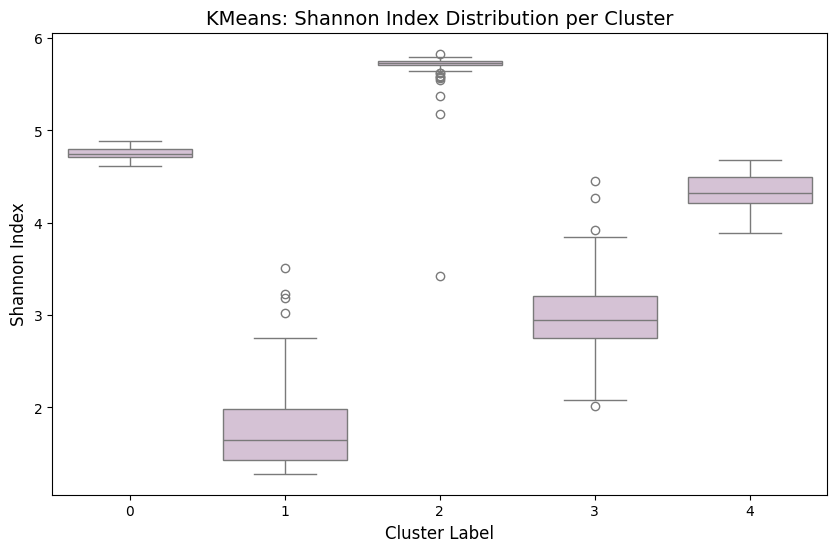

In [29]:
plt.figure(figsize=(10, 6))

# Use seaborn for color control (matplotlib boxplot itself is tricky with colors)
sns.boxplot(x='cluster_label', y='shannon_index', data=shannon_df, color='thistle')  # 'thistle' is a nice lavender

plt.title("KMeans: Shannon Index Distribution per Cluster", fontsize=14)
plt.xlabel("Cluster Label", fontsize=12)
plt.ylabel("Shannon Index", fontsize=12)
plt.grid(False)
plt.show()
plt.show()

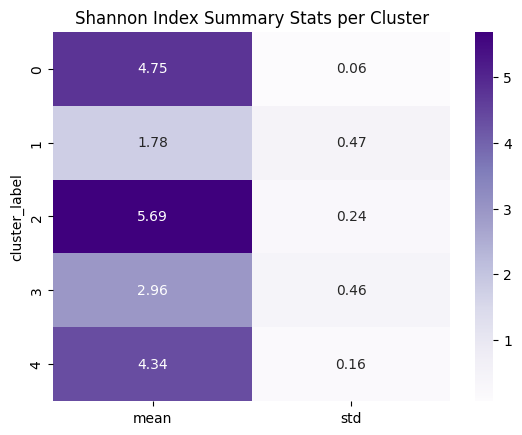

In [30]:
summary = shannon_df.groupby('cluster_label')['shannon_index'].agg(['mean', 'std']).reset_index()
sns.heatmap(summary.set_index('cluster_label'), annot=True, cmap='Purples', fmt=".2f")
plt.title("Shannon Index Summary Stats per Cluster")
plt.show()


C:\Users\alina\AppData\Local\Temp\ipykernel_32188\2571486921.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')


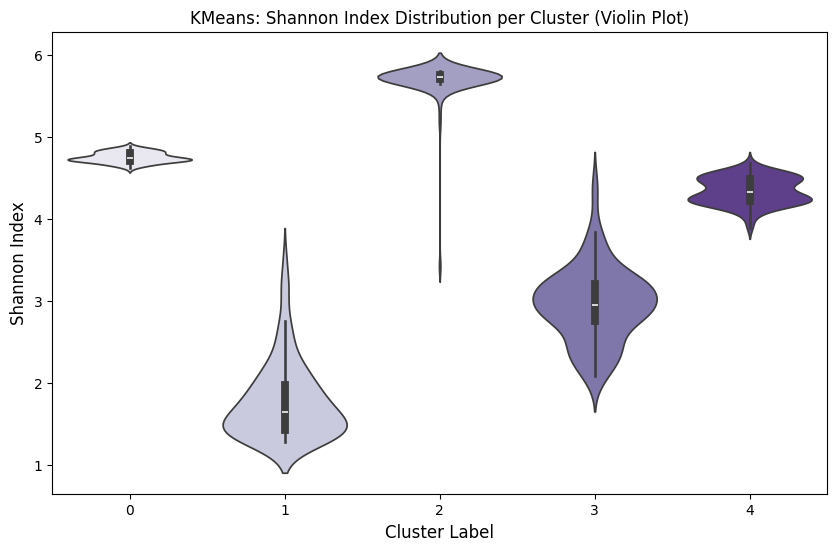

In [34]:
plt.figure(figsize=(10, 6))

sns.violinplot(x='cluster_label', y='shannon_index', data=shannon_df, palette='Purples')
plt.title('KMeans: Shannon Index Distribution per Cluster (Violin Plot)', fontsize=12)
plt.xlabel('Cluster Label', fontsize=12)
plt.ylabel('Shannon Index', fontsize=12)
plt.show()